In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
from skimage.feature import hog

In [2]:
# Define a function to return some characteristics of the dataset 
def data_look(car_list, notcar_list):
    data_dict = {}
    # Define a key in data_dict "n_cars" and store the number of car images
    data_dict["n_cars"] = 0
    data_dict["n_cars"] = len(car_list)
    # Define a key "n_notcars" and store the number of notcar images
    data_dict["n_notcars"] = 0
    data_dict["n_notcars"] = len(notcar_list)
    # Read in a test image, either car or notcar
    # Define a key "image_shape" and store the test image shape 3-tuple
    data_dict["image_shape"] = (0, 0, 0)
    image = mpimg.imread(car_list[0])
    data_dict["image_shape"] = image.shape
    # Define a key "data_type" and store the data type of the test image.
    data_dict["data_type"] = None
    data_dict["data_type"] = image.dtype
    # Return data_dict
    return data_dict

Your function returned a count of 8792  cars and 8968  non-cars
of size:  (64, 64, 3)  and data type: float32


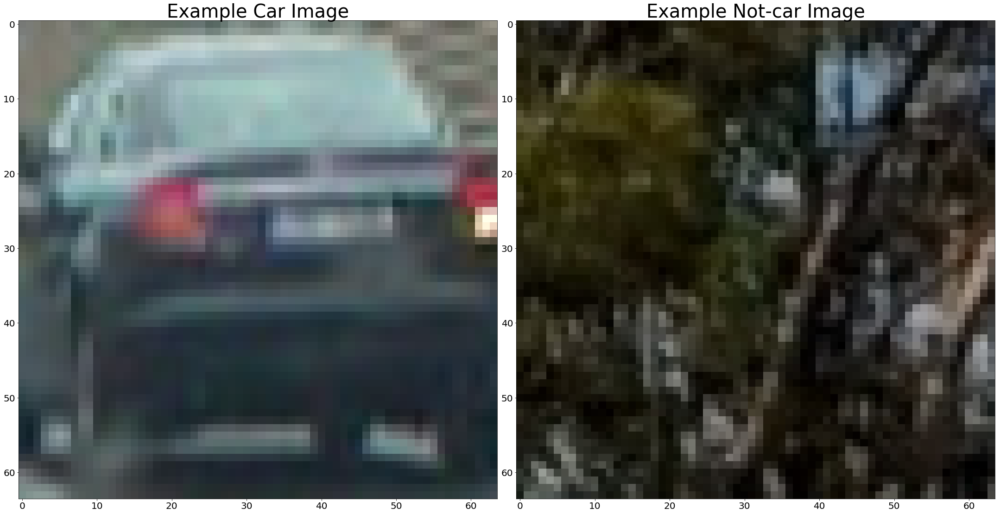

In [3]:
cars = glob.glob('vehicles/**/*.png')
notcars = glob.glob('non-vehicles/**/*.png')        
#print(cars)
#print(notcars)
#print(len(cars))
#print(len(notcars))
#print(cars[3])
data_info = data_look(cars, notcars)

print('Your function returned a count of', 
      data_info["n_cars"], ' cars and', 
      data_info["n_notcars"], ' non-cars')
print('of size: ',data_info["image_shape"], ' and data type:', 
      data_info["data_type"])
# Just for fun choose random car / not-car indices and plot example images   
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))
    
# Read in car / not-car images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])


# Plot the examples
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 16))
f.tight_layout()
ax1.imshow(car_image)
ax1.set_title('Example Car Image', fontsize=40)
ax1.xaxis.set_tick_params(labelsize=20)
ax1.yaxis.set_tick_params(labelsize=20)
ax2.imshow(notcar_image)
ax2.set_title('Example Not-car Image', fontsize=40)
ax2.xaxis.set_tick_params(labelsize=20)
ax2.yaxis.set_tick_params(labelsize=20)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('output_images/car_not_car.jpg')

In [4]:
# Define a function to return HOG features and visualization
# Features will always be the first element of the return
# Image data will be returned as the second element if visualize= True
# Otherwise there is no second return element

def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=True, 
                     feature_vec=True):
                         
    return_list = hog(img, orientations=orient,
                          pixels_per_cell=(pix_per_cell, pix_per_cell), 
                          cells_per_block=(cell_per_block, cell_per_block), transform_sqrt=False,
                          visualise=vis, feature_vector=feature_vec,
                          block_norm="L2-Hys")
    
    # name returns explicitly
    hog_features = return_list[0]
    if vis:
        hog_image = return_list[1]
        return hog_features, hog_image
    else:
        return hog_features

(7, 7, 2, 2, 9)


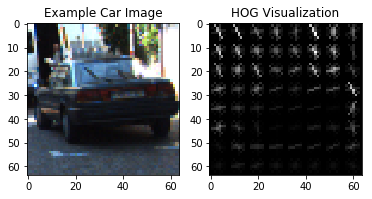

In [5]:
# Generate a random index to look at a car image
ind = np.random.randint(0, len(cars))
# Read in the image
image = mpimg.imread(cars[ind])
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Call our function with vis=True to see an image output
features, hog_image = get_hog_features(gray, orient= 9, 
                        pix_per_cell= 8, cell_per_block= 2, 
                        vis=True, feature_vec=False)
print(features.shape)

# Plot the examples
fig = plt.figure()
plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Example Car Image')
plt.subplot(122)
plt.imshow(hog_image, cmap='gray')
plt.title('HOG Visualization')

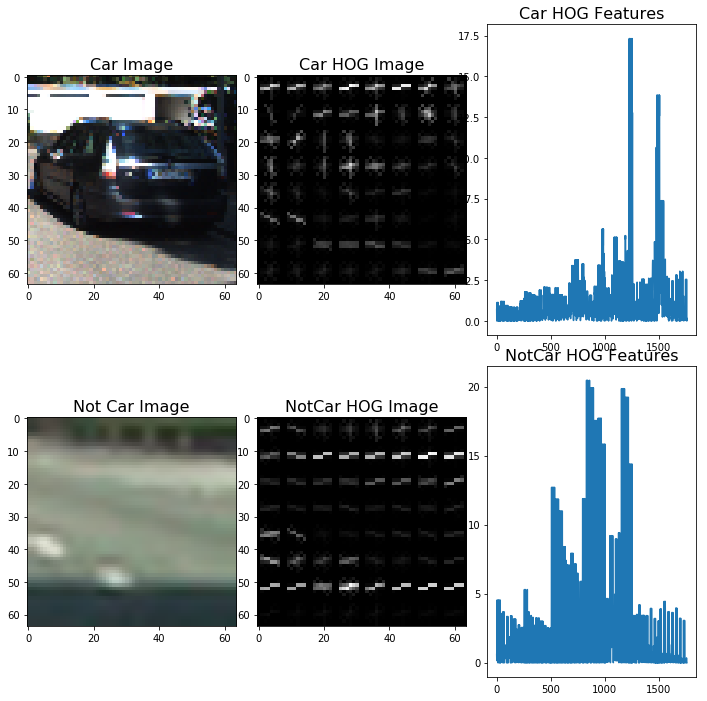

In [6]:
# Generate a random index to look at a car image
ind_car = np.random.randint(0, len(cars))

# Generate a random index to look at a non-car image
ind_notcar = np.random.randint(0, len(notcars))

car_image = mpimg.imread(cars[ind_car])
notcar_image = mpimg.imread(notcars[ind_notcar])

car_features, car_hog_image = get_hog_features(car_image[:,:,1], orient= 9, 
                                               pix_per_cell= 8, cell_per_block= 2, vis=True, feature_vec=True)
notcar_features, notcar_hog_image = get_hog_features(notcar_image[:,:,1], orient= 9, 
                                                     pix_per_cell= 8, cell_per_block= 2, vis=True, feature_vec=True)

# Visualize 
f, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(12,12))
f.subplots_adjust(hspace = .1, wspace=.1)
ax1.imshow(car_image)
ax1.set_title('Car Image', fontsize=16)
ax2.imshow(car_hog_image, cmap='gray')
ax2.set_title('Car HOG Image', fontsize=16)
ax3.plot(car_features)
ax3.set_title('Car HOG Features', fontsize=16)
ax4.imshow(notcar_image)
ax4.set_title('Not Car Image', fontsize=16)
ax5.imshow(notcar_hog_image, cmap='gray')
ax5.set_title('NotCar HOG Image', fontsize=16)
ax6.plot(notcar_features)
ax6.set_title('NotCar HOG Features', fontsize=16)

plt.savefig('output_images/HOG_Example_1.jpg')

In [7]:
# Build a classifier using combined features from spatially binned color, color histograms, and HOG
import time
import sklearn
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from skimage.feature import hog

In [8]:
# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features  
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), block_norm= 'L2-Hys',
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), block_norm= 'L2-Hys',
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

In [9]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial(), color_hist(), and get_hog_features()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = cv2.imread(file)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

In [10]:
### TODO: Tweak these parameters and see how the results change.
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 15  # HOG orientations
pix_per_cell = 16 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

t=time.time()
car_features = extract_features(cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(notcars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract combined features...')

# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=rand_state)
    
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X_train)
# Apply the scaler to X
X_train = X_scaler.transform(X_train)
X_test = X_scaler.transform(X_test)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Using spatial binning of:',spatial_size[0],
    'and', hist_bins,'histogram bins')
print('Feature vector length:', len(X_train[0]))

73.19 Seconds to extract combined features...
Using: 15 orientations 16 pixels per cell and 2 cells per block
Using spatial binning of: 32 and 32 histogram bins
Feature vector length: 4788


In [11]:
print(X_train.shape)
print(X_train)
print(X_test.shape)

(14208, 4788)
[[-0.44718564 -0.25348037 -0.56597964 ..., -0.64769619 -0.61371783
  -0.43178309]
 [-0.33929307  0.21197347 -0.65672954 ..., -0.72578751 -0.61371783
  -0.43178309]
 [-0.44718564  0.56106385  0.06926961 ..., -0.82635283 -0.61371783
  -0.43178309]
 ..., 
 [ 1.02734614  0.21197347 -0.47522975 ...,  3.23020527 -0.61371783
  -0.43178309]
 [-0.12350793 -0.36984383  0.97676854 ..., -0.4308889   0.07587358
  -0.13046306]
 [ 0.63174005 -0.95166113  0.70451886 ...,  0.5954744   0.48439171
   0.64932831]]
(3552, 4788)


In [12]:
# Use a linear SVC 
svc = LinearSVC(C=0.001)
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

9.1 Seconds to train SVC...
Test Accuracy of SVC =  0.9927
My SVC predicts:  [ 1.  0.  1.  1.  0.  0.  1.  0.  1.  1.]
For these 10 labels:  [ 1.  0.  1.  1.  0.  0.  1.  0.  1.  1.]
0.001 Seconds to predict 10 labels with SVC


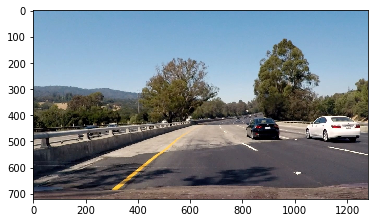

In [13]:
image = mpimg.imread('test_images/test4.jpg')
draw_image = np.copy(image)
#image = image.astype(np.float32)/255
fig = plt.figure()
plt.imshow(image)
#print(image)

In [14]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

In [15]:
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, 
              hist_bins, show_all_rects=False):
    
    draw_img = np.copy(img)
    #img = img.astype(np.float32)/255
    
    # define rectangles where cars are detected
    rects = []
    
    img_tosearch = img[ystart:ystop,:,:]
    #ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            #print(spatial_features.shape)
            #print(hist_features.shape)
            #print(hog_features.shape)
            reshape_features = np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1)
            #print(reshape_features.shape)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1 or show_all_rects == True:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6)
                rects.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                
    return draw_img, rects

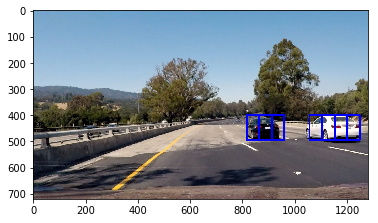

In [16]:
ystart = 400
ystop = 656
scale = 1.5
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 15  # HOG orientations
pix_per_cell = 16 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins

out_img, rects = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,
                   show_all_rects=False)

plt.imshow(out_img)

273


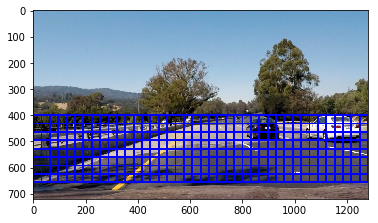

In [17]:
colorspace = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 15
pix_per_cell = 16
cell_per_block = 2
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"

ystart = 400
ystop = 656
scale = 1.0
out_img,rects = find_cars(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block,spatial_size, hist_bins,show_all_rects=True)

plt.imshow(out_img)
print(len(rects))

In [18]:
### Read images from project video for designing multi-scale windows 

vidcap = cv2.VideoCapture('project_video.mp4')

success,image = vidcap.read()
# image is an array of array of [R,G,B] values
count = 0; 
success = True
while success:
    success,image = vidcap.read()
    if count%60==0:
        cv2.imwrite("video_images"+"\\frame_%d.jpg" % count, image)     # save frame as JPEG file
    if cv2.waitKey(10) == 27:                     # exit if Escape is hit
        break
    count += 1

35


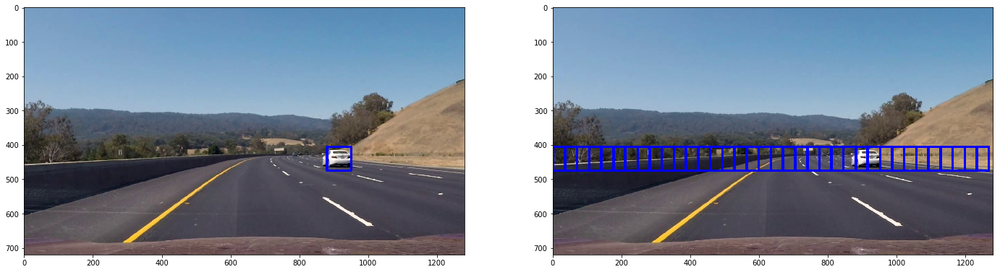

In [19]:
img = mpimg.imread('./video_images/frame_660.jpg')

ystart = 405
ystop = 490
scale = 1.1
out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
out_web,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=True)

plt.figure(figsize=(24, 12))
plt.subplot(121)
plt.imshow(out_img)
plt.subplot(122)
plt.imshow(out_web)
#plt.tight_layout(pad=0.1, w_pad=0.5, h_pad=0.1)
plt.savefig('output_images/SmallScaleFactor.jpg', bbox_inches='tight')

print(len(rects))

38


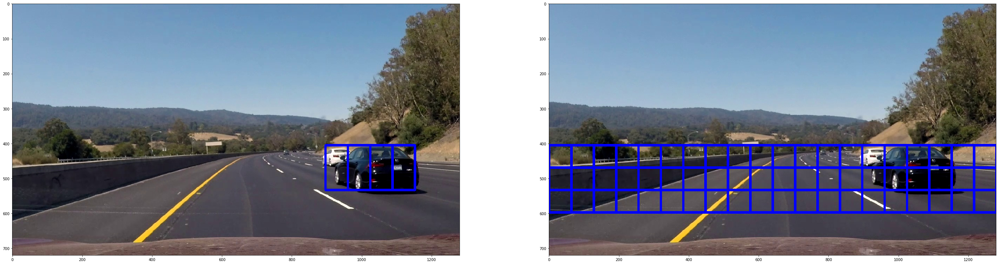

In [20]:
img = mpimg.imread('./video_images/frame_780.jpg')

ystart = 405
ystop = 600
scale = 2
out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
out_web,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=True)

plt.figure(figsize=(48, 24))
plt.subplot(121)
plt.imshow(out_img)
plt.subplot(122)
plt.imshow(out_web)

plt.savefig('output_images/LargeScaleFactor.jpg', bbox_inches='tight')

print(len(rects))

58


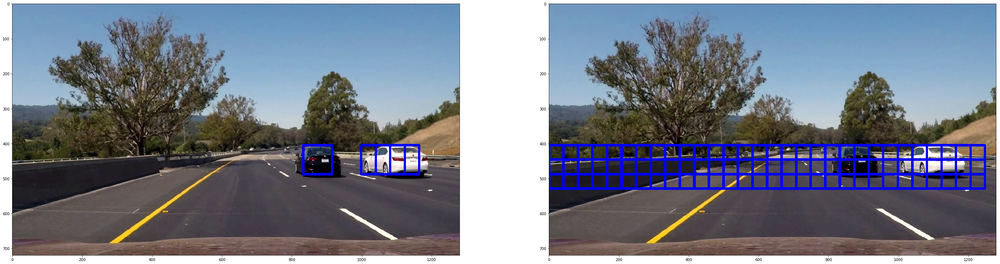

In [21]:
img = mpimg.imread('./video_images/frame_960.jpg')

ystart = 405
ystop = 550
scale = 1.3
out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
out_web,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=True)

plt.figure(figsize=(48, 24))
plt.subplot(121)
plt.imshow(out_img)
plt.subplot(122)
plt.imshow(out_web)

print(len(rects))

32


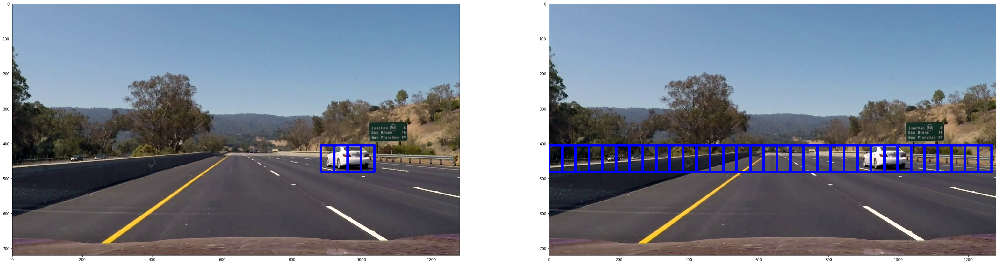

In [22]:
img = mpimg.imread('./video_images/frame_480.jpg')

ystart = 405
ystop = 500
scale = 1.2
out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
out_web,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=True)

plt.figure(figsize=(48, 24))
plt.subplot(121)
plt.imshow(out_img)
plt.subplot(122)
plt.imshow(out_web)

print(len(rects))

19


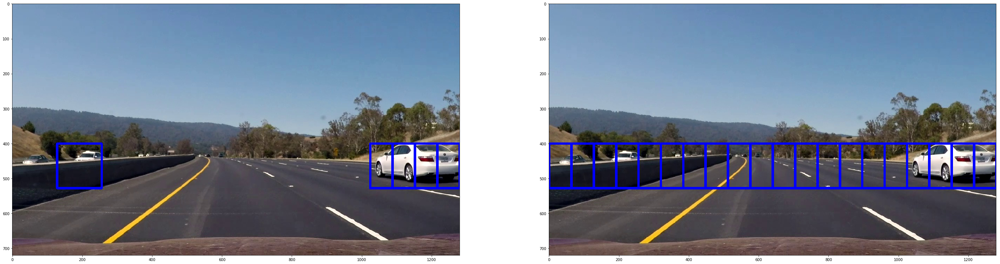

In [23]:
img = mpimg.imread('./video_images/frame_240.jpg')

ystart = 400
ystop = 580
scale = 2
out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
out_web,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=True)

plt.figure(figsize=(48, 24))
plt.subplot(121)
plt.imshow(out_img)
plt.subplot(122)
plt.imshow(out_web)

print(len(rects))

58


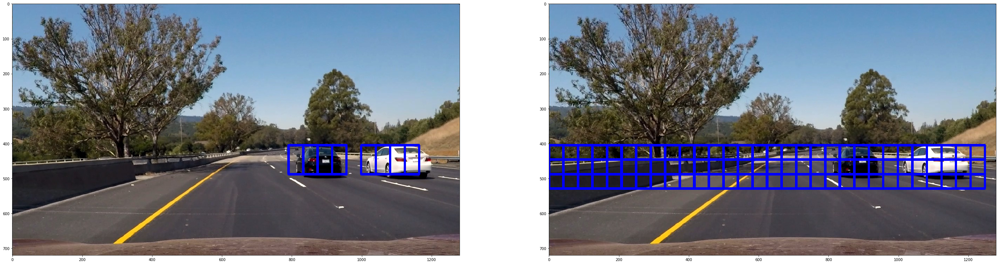

In [24]:
img = mpimg.imread('./test_images/test6.jpg')

ystart = 405
ystop = 550
scale = 1.3
out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
out_web,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=True)

plt.figure(figsize=(48, 24))
plt.subplot(121)
plt.imshow(out_img)
plt.subplot(122)
plt.imshow(out_web)
plt.savefig('output_images/Test6ScaleFactor.jpg', bbox_inches='tight')

print(len(rects))

In [25]:
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

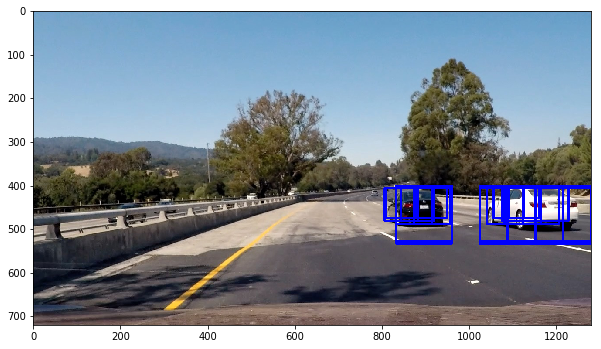

In [56]:
img = mpimg.imread('./test_images/test4.jpg')
rectangles = []

ystart = 405
ystop = 490
scale = 1.1
out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
rectangles.append(rects)

ystart = 405
ystop = 600
scale = 2
out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
rectangles.append(rects)

ystart = 405
ystop = 550
scale = 1.3
out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
rectangles.append(rects)

ystart = 405
ystop = 500
scale = 1.2
out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
rectangles.append(rects)

ystart = 400
ystop = 580
scale = 2
out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
rectangles.append(rects)

rectangles = [item for sublist in rectangles for item in sublist]
img_with_rects = draw_boxes(img, rectangles, color=(0, 0, 255), thick=3)
plt.figure(figsize=(10,10))
plt.imshow(img_with_rects)
plt.savefig('output_images/combinedboundingboxes.jpg', bbox_inches='tight')

In [40]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

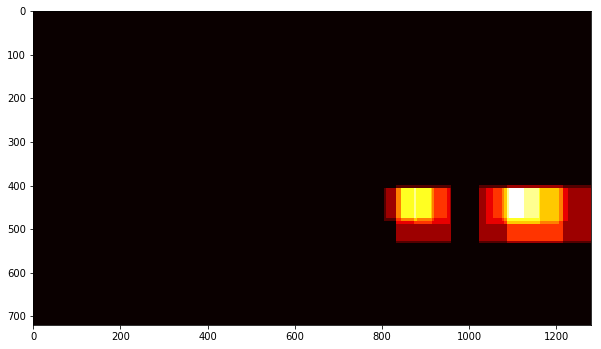

In [57]:
# Read in image similar to one shown above 
image = mpimg.imread('./test_images/test4.jpg')
heat = np.zeros_like(image[:,:,0]).astype(np.float)

# Add heat to each box in box list
heat = add_heat(heat,rectangles)
    
plt.figure(figsize=(10,10))
plt.imshow(heat, cmap='hot')
plt.savefig('output_images/heatmap.jpg', bbox_inches='tight')

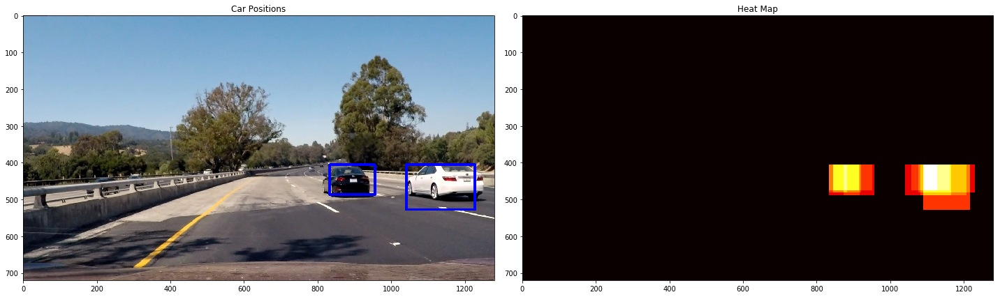

In [58]:
from scipy.ndimage.measurements import label
# Apply threshold to help remove false positives
heat = apply_threshold(heat,2)

# Visualize the heatmap when displaying    
heatmap = np.clip(heat, 0, 255)

# Find final boxes from heatmap using label function
labels = label(heatmap)
draw_img = draw_labeled_bboxes(np.copy(img), labels)

fig = plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(draw_img)
plt.title('Car Positions')
plt.subplot(122)
plt.imshow(heat, cmap='hot')
plt.title('Heat Map')
fig.tight_layout()
plt.savefig('output_images/UpdatedHeatMap.jpg', bbox_inches='tight')

In [43]:
def image_processing(img):

    rectangles = []

    colorspace = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
    orient = 15
    pix_per_cell = 16
    cell_per_block = 2
    hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
    
    ystart = 405
    ystop = 510
    scale = 1.0
    out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
    rectangles.append(rects)

    ystart = 405
    ystop = 490
    scale = 1.1
    out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
    rectangles.append(rects)

    ystart = 405
    ystop = 600
    scale = 2
    out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
    rectangles.append(rects)

    ystart = 405
    ystop = 550
    scale = 1.3
    out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
    rectangles.append(rects)

    ystart = 405
    ystop = 500
    scale = 1.2
    out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
    rectangles.append(rects)

    ystart = 400
    ystop = 580
    scale = 2
    out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
    rectangles.append(rects)

    out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
    rectangles.append(rects)

    rectangles = [item for sublist in rectangles for item in sublist] 
    
    heat = np.zeros_like(img[:,:,0])
    heat = add_heat(heat, rectangles)
    heat = apply_threshold(heat, 3)
    labels = label(heat)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img

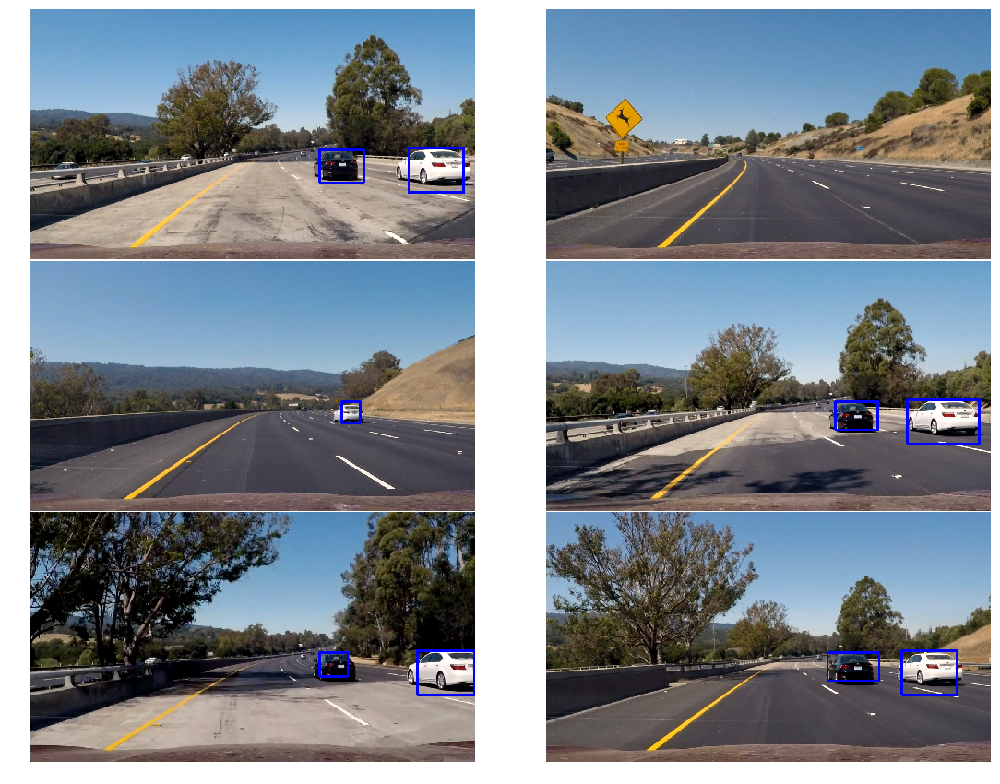

In [59]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axis = plt.subplots(3, 2, figsize=(20,15))
fig.subplots_adjust(hspace = .004, wspace=.002)
axis = axis.ravel()

for i, im in enumerate(test_images):
    axis[i].imshow(image_processing(mpimg.imread(im)))
    axis[i].axis('off')
    
plt.savefig('output_images/AllTestImagesCarDetect.jpg', bbox_inches='tight')

In [32]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [33]:
from functools import reduce
import os

class HeatHistory():
    def __init__(self):
        self.history = []

In [34]:
def image_processing_mem(img):

    rectangles = []

    colorspace = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
    orient = 15
    pix_per_cell = 16
    cell_per_block = 2
    hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
    
    ystart = 405
    ystop = 510
    scale = 1.0
    out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
    rectangles.append(rects)

    ystart = 405
    ystop = 490
    scale = 1.1
    out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
    rectangles.append(rects)

    ystart = 405
    ystop = 600
    scale = 2
    out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
    rectangles.append(rects)

    ystart = 405
    ystop = 550
    scale = 1.3
    out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
    rectangles.append(rects)

    ystart = 405
    ystop = 500
    scale = 1.2
    out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
    rectangles.append(rects)

    ystart = 400
    ystop = 580
    scale = 2
    out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
    rectangles.append(rects)

    out_img,rects = find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rects=False)
    rectangles.append(rects)

    rectangles = [item for sublist in rectangles for item in sublist] 
    
    heat = np.zeros_like(img[:,:,0])
    heat = add_heat(heat, rectangles)
    
    if len(history.history) >= 7:
        history.history = history.history[1:]
    
    history.history.append(heat)
    heat_history = reduce(lambda h, acc: h + acc, history.history)/7
    
    heat = apply_threshold(heat_history, 3)
     
    labels = label(heat)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img

In [35]:
history = HeatHistory()

white_output = 'project_video_output_mem.mp4'

## Use the both lines for a shorter subclip, use only the first line for entire video
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(image_processing_mem) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video project_video_output_mem.mp4
[MoviePy] Writing video project_video_output_mem.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [15:19<00:00,  1.35it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output_mem.mp4 

Wall time: 15min 20s


In [36]:
white_output = 'test_video_output_mem.mp4'

## Use the both lines for a shorter subclip, use only the first line for entire video
clip1 = VideoFileClip("test_video.mp4")
#clip1 = clip1.subclip(37,43)
white_clip = clip1.fl_image(image_processing_mem) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video test_video_output_mem.mp4
[MoviePy] Writing video test_video_output_mem.mp4


 97%|███████████████████████████████████████████████████████████████████████████████▉  | 38/39 [00:26<00:00,  1.46it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_output_mem.mp4 

Wall time: 27.6 s
